Q1

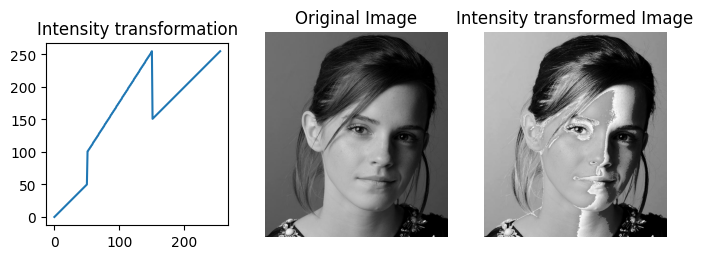

In [111]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

c = np.array([(50, 50), (50, 100), (150, 255), (150, 150)])
t1 = np.linspace(0, c[0, 1], c[0, 0] + 1 - 0).astype('uint8')
t2 = np.linspace(c[0, 1] + 1 , c[1, 1], c[1, 0] - c[0, 0]).astype('uint8')
t3 = np.linspace(c[1, 1] + 1 , c[2, 1], c[2, 0] - c[1, 0]).astype('uint8')
t4 = np.linspace(c[2, 1] + 1 , c[3, 1], c[3, 0] - c[2, 0]).astype('uint8')
t5 = np.linspace(c[3, 1] + 1 , 255, 255 - c[3, 0]).astype('uint8')

transform = np.concatenate((t1,t2,t3,t4,t5), axis=0).astype('uint8')

img_orig = cv.imread('emma.jpg', cv.IMREAD_GRAYSCALE)
image_transformed = cv.LUT(img_orig, transform)

fig, ax = plt.subplots(1,3,figsize=(8,8))
ax[0].plot(transform), ax[0].set_title("Intensity transformation"), ax[0].set_aspect('equal')
ax[1].imshow(cv.cvtColor(img_orig,cv.COLOR_BGR2RGB)), ax[1].axis('off'), ax[1].set_title("Original Image")
ax[2].imshow(cv.cvtColor(image_transformed,cv.COLOR_BGR2RGB)), ax[2].axis('off'), ax[2].set_title("Intensity transformed Image")
plt.show()


Q2

(a),(b)

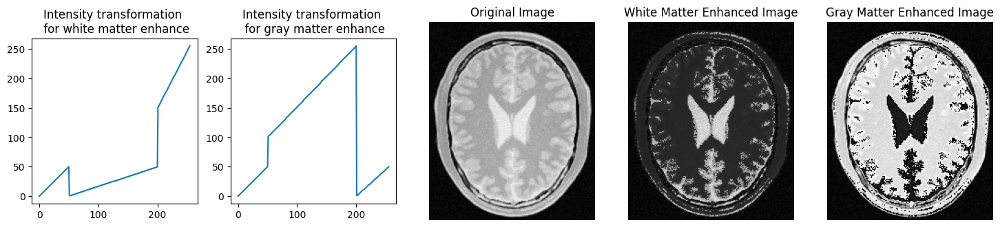

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_orig = cv.imread("BrainProtonDensitySlice9.png", cv.IMREAD_GRAYSCALE)

c = np.array([(50, 50), (50, 0), (200, 50), (200, 150)])
t1 = np.linspace(0, c[0, 1], c[0, 0] + 1 - 0).astype('uint8')
t2 = np.linspace(c[0, 1] + 1 , c[1, 1], c[1, 0] - c[0, 0]).astype('uint8')
t3 = np.linspace(c[1, 1] + 1 , c[2, 1], c[2, 0] - c[1, 0]).astype('uint8')
t4 = np.linspace(c[2, 1] + 1 , c[3, 1], c[3, 0] - c[2, 0]).astype('uint8')
t5 = np.linspace(c[3, 1] + 1 , 255, 255 - c[3, 0]).astype('uint8')
s = np.array([(50, 50), (50, 100), (200, 255), (200, 0)])
s1 = np.linspace(0, s[0, 1], s[0, 0] + 1 - 0).astype('uint8')
s2 = np.linspace(s[0, 1] + 1 , s[1, 1], s[1, 0] - s[0, 0]).astype('uint8')
s3 = np.linspace(s[1, 1] + 1 , s[2, 1], s[2, 0] - s[1, 0]).astype('uint8')
s4 = np.linspace(s[2, 1] + 1 , s[3, 1], s[3, 0] - s[2, 0]).astype('uint8')
s5 = np.linspace(s[3, 1] + 1 , 50, 255 - s[3, 0]).astype('uint8')
transform1 = np.concatenate((t1, t2,t3,t4,t5), axis=0).astype('uint8')
transform2 = np.concatenate((s1, s2,s3,s4,s5), axis=0).astype('uint8')
g = cv.LUT(img_orig,transform1)
h = cv.LUT(img_orig,transform2)

fig, ax = plt.subplots(1,5,figsize=(18,18))
ax[0].plot(transform1), ax[0].set_aspect('equal'), ax[0].set_title("Intensity transformation \n for white matter enhance")
ax[1].plot(transform2), ax[1].set_aspect('equal'), ax[1].set_title("Intensity transformation \n for gray matter enhance")
ax[2].imshow(cv.cvtColor(img_orig,cv.COLOR_BGR2RGB)), ax[2].axis('off'), ax[2].set_title("Original Image")
ax[3].imshow(cv.cvtColor(g,cv.COLOR_BGR2RGB)), ax[3].axis('off'), ax[3].set_title("White Matter Enhanced Image")
ax[4].imshow(cv.cvtColor(h,cv.COLOR_BGR2RGB)), ax[4].axis('off'), ax[4].set_title("Gray Matter Enhanced Image")
plt.show()

Q3 a,b

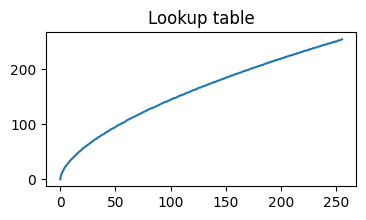

Gamma = 0.6


In [47]:
f = cv.imread(r'highlights_and_shadows.jpg',cv.IMREAD_COLOR)
assert f is not None

original = cv.cvtColor(f,cv.COLOR_BGR2RGB)
lab = cv.cvtColor(f,cv.COLOR_BGR2Lab)
L, a, b = cv.split(lab)
gamma = 0.6
t = np.array([(p/255.0)**(gamma)*255.0 for p in range (0,256)]).astype('uint8')

fig, ax = plt.subplots(1,1, figsize = (4,2))
ax.plot(t)
ax.set_title('Lookup table')
plt.show()

print("Gamma =", gamma)

plt.show()

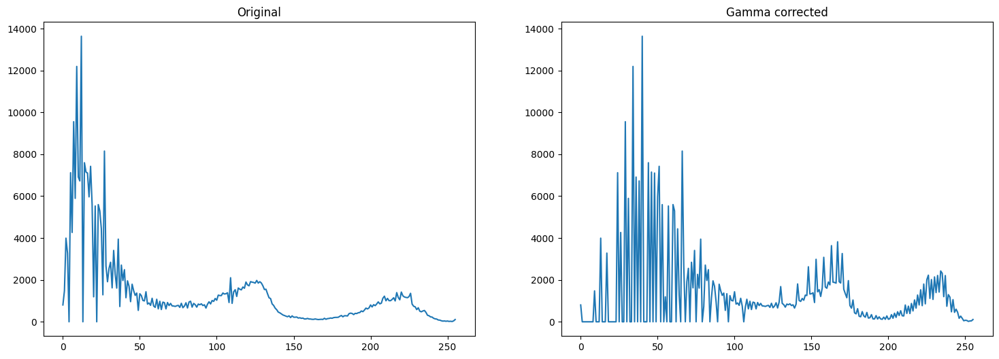

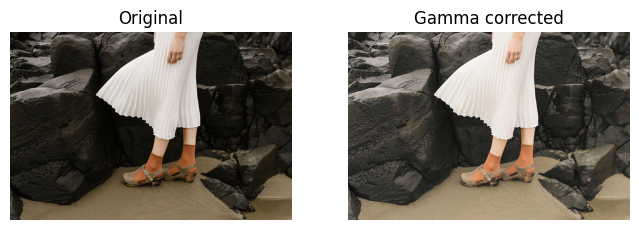

In [73]:
g = cv.LUT(L, t)
lab_orig = cv.cvtColor(f,cv.COLOR_BGR2Lab)
lab[:,:,0] = g

img = cv.cvtColor(lab, cv.COLOR_Lab2RGB).astype('uint8')
hist_original = cv.calcHist([lab_orig],[0],None,[256],[0,256])
hist_gamma = cv.calcHist([lab],[0],None,[256],[0,256])

fig, ar = plt.subplots(1,2, figsize =(18,6))
ar[1].plot(hist_gamma)
ar[1].set_title('Gamma corrected')
ar[0].plot(hist_original)
ar[0].set_title('Original')


fig, ar2 = plt.subplots(1,2, figsize = (8,3))
ar2[0].imshow(original)
ar2[0].axis('off')
ar2[0].set_title('Original')

ar2[1].imshow(img)
ar2[1].axis('off')
ar2[1].set_title('Gamma corrected')

plt.show()

Q4

(a)

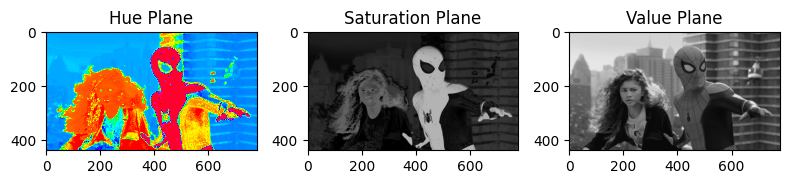

In [81]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2

image_path = 'F:\Aca sem 5\Image processing\Assignment_1\Image_Processing\spider.png'

pil_image = Image.open(image_path)
image_np = np.array(pil_image)
hsv_image = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)

planes = [hsv_image[:,:,0], hsv_image[:,:,1], hsv_image[:,:,2]]
titles = ['Hue Plane', 'Saturation Plane', 'Value Plane']

plt.figure(figsize=(8, 3))

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(planes[i], cmap='gray' if i != 0 else 'hsv', vmin=0, vmax=255 if i != 0 else 179)
    plt.title(titles[i])

plt.tight_layout()
plt.show()

(b)

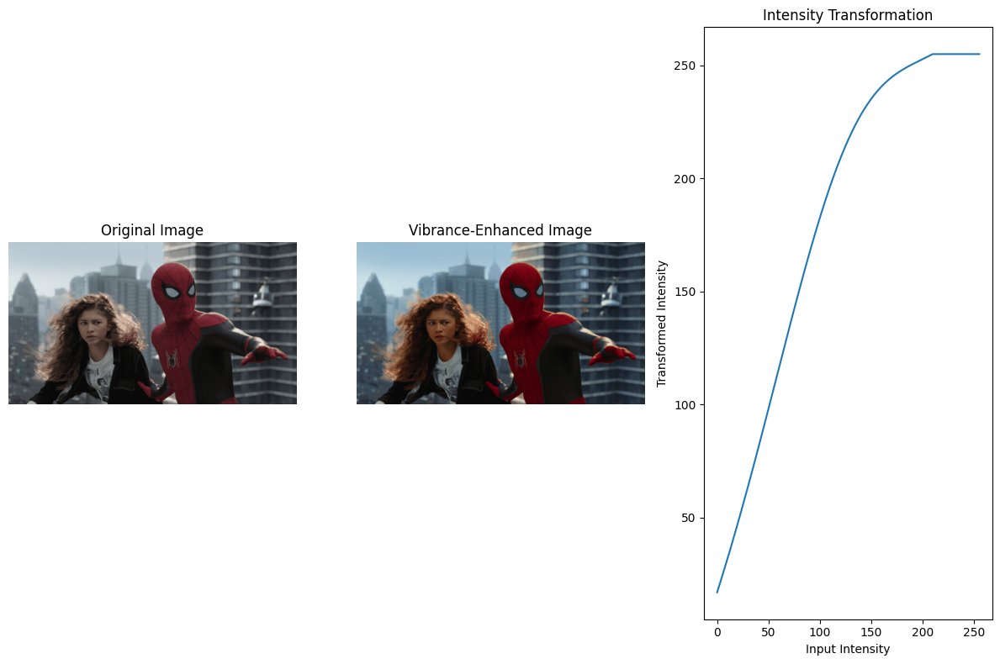

(None, None)

In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = 'F:\Aca sem 5\Image processing\Assignment_1\Image_Processing\spider.png'
image = cv2.imread(image_path)
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

hue_plane, saturation_plane, value_plane = hsv_image[:,:,0], hsv_image[:,:,1], hsv_image[:,:,2]

a, sigma = 0.7, 70
x = np.arange(256)
y = np.minimum(x + a * 128 * np.exp(-(x - 128)**2 / (2 * sigma**2)), 255)

transformed_saturation_plane = y[saturation_plane]
transformed_saturation_plane = np.clip(transformed_saturation_plane, 0, 255)

hue_plane, transformed_saturation_plane, value_plane = hue_plane.astype(np.uint8), transformed_saturation_plane.astype(np.uint8), value_plane.astype(np.uint8)
vibrance_enhanced_hsv_image = np.stack([hue_plane, transformed_saturation_plane, value_plane], axis=-1)
vibrance_enhanced_image = cv2.cvtColor(vibrance_enhanced_hsv_image, cv2.COLOR_HSV2BGR)

plt.figure(figsize=(12, 8))
plt.subplot(131), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original Image'), plt.axis('off')
plt.subplot(132), plt.imshow(cv2.cvtColor(vibrance_enhanced_image, cv2.COLOR_BGR2RGB)), plt.title('Vibrance-Enhanced Image'), plt.axis('off')
plt.subplot(133), plt.plot(x, y), plt.title('Intensity Transformation'), plt.xlabel('Input Intensity'), plt.ylabel('Transformed Intensity')
plt.tight_layout(), plt.show()


Q5

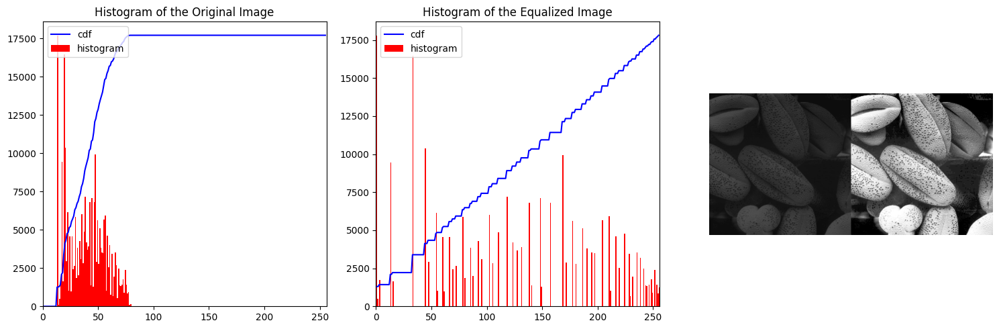

In [88]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('shells.jpg', cv.IMREAD_GRAYSCALE)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

hist, bins = np.histogram(img.ravel(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()
axes[0].plot(cdf_normalized, color='b')
axes[0].hist(img.flatten(), 256, [0, 256], color='r')
axes[0].set_xlim([0, 256])
axes[0].legend(('cdf', 'histogram'), loc='upper left')
axes[0].set_title('Histogram of the Original Image')

equ = cv.equalizeHist(img)
hist, bins = np.histogram(equ.ravel(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()
axes[1].plot(cdf_normalized, color='b')
axes[1].hist(equ.flatten(), 256, [0, 256], color='r')
axes[1].set_xlim([0, 256])
axes[1].legend(('cdf', 'histogram'), loc='upper left')
axes[1].set_title('Histogram of the Equalized Image')

res = np.hstack((img, equ))
axes[2].imshow(res, cmap='gray')
axes[2].axis('off')

plt.tight_layout()
plt.show()


Q6

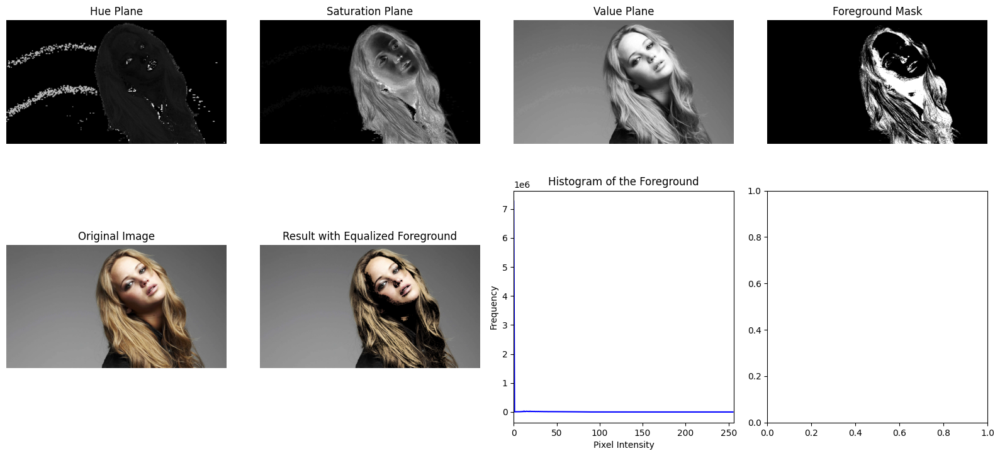

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('jeniffer.jpg')
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Hue, Saturation, and Value planes
for i, plane_name in enumerate(["Hue", "Saturation", "Value"]):
    axes[0, i].imshow(hsv[:, :, i], cmap='gray')
    axes[0, i].set_title(f'{plane_name} Plane')
    axes[0, i].axis('off')

threshold_plane = hsv[:, :, 1]
_, mask = cv2.threshold(threshold_plane, 120, 255, cv2.THRESH_BINARY)

# Foreground mask
axes[0, 3].imshow(mask, cmap='gray')
axes[0, 3].set_title('Foreground Mask')
axes[0, 3].axis('off')

foreground = cv2.bitwise_and(image, image, mask=mask)
hist = cv2.calcHist([foreground], [0], None, [256], [0, 256])
cumulative = np.cumsum(hist)
cumulative_normalized = cumulative / cumulative[-1]

# Apply histogram equalization to the foreground
equalized_foreground = np.interp(foreground[:, :, 0], np.arange(256), cumulative_normalized).astype(np.uint8)

background_mask = cv2.bitwise_not(mask)
background = cv2.bitwise_and(image, image, mask=background_mask)

result_image = cv2.add(background, cv2.cvtColor(equalized_foreground, cv2.COLOR_GRAY2BGR))

# Original image
axes[1, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Original Image')
axes[1, 0].axis('off')

# Result with equalized foreground
axes[1, 1].imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Result with Equalized Foreground')
axes[1, 1].axis('off')

# Histogram of the foreground
axes[1, 2].plot(hist, color='b')
axes[1, 2].set_xlim([0, 256])
axes[1, 2].set_xlabel('Pixel Intensity')
axes[1, 2].set_ylabel('Frequency')
axes[1, 2].set_title('Histogram of the Foreground')

plt.tight_layout()
plt.show()


Q7

(a)

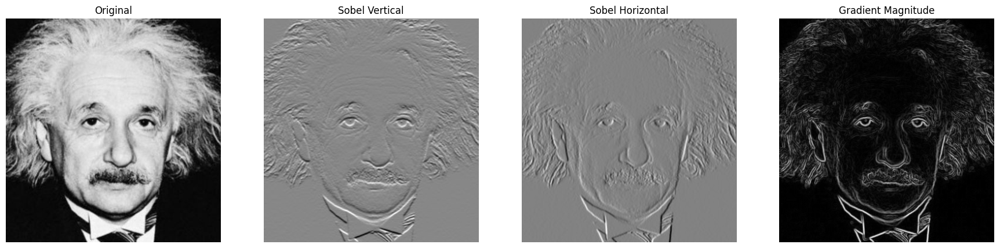

In [94]:
f = cv.imread(r'einstein.png', cv.IMREAD_GRAYSCALE).astype(np.float32)
assert f is not None

sobel_v = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype='float')
f_x = cv.filter2D(f, -1, sobel_v)
sobel_h = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype='float')
f_y = cv.filter2D(f, -1, sobel_h)
grad = np.sqrt(f_x**2 + f_y**2)

fig, ax = plt.subplots(1,4, figsize=(22,10))
ax[0].imshow(f, cmap='gray',vmin=0,vmax=255)
ax[0].set_title('Original')
ax[1].imshow(f_x, cmap='gray')
ax[1].set_title('Sobel Vertical')
ax[2].imshow(f_y, cmap='gray')
ax[2].set_title('Sobel Horizontal')
ax[3].imshow(grad, cmap='gray')
ax[3].set_title('Gradient Magnitude')
for i in range(4):
    ax[i].axis('off')
plt.show()

(b)

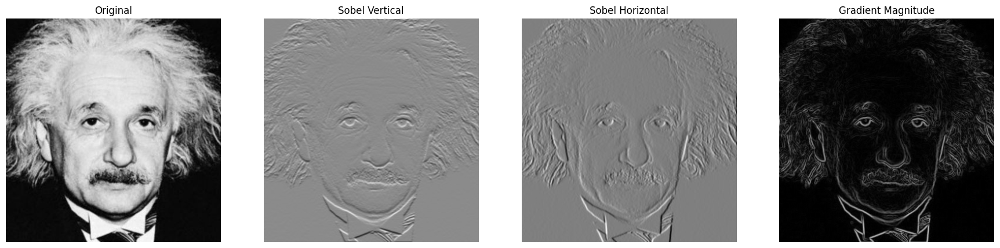

In [95]:
def convolution2d(image, kernel):
    m, n = kernel.shape
    if (m == n):
        y, x = image.shape
        y = y - m + 1
        x = x - m + 1
        new_image = np.zeros((y,x))
        for i in range(y):
            for j in range(x):
                new_image[i][j] = np.sum(image[i:i+m, j:j+m]*kernel)
    return new_image

f = cv.imread(r'einstein.png', cv.IMREAD_GRAYSCALE).astype(np.float32)
assert f is not None
rows, cols = f.shape[0] , f.shape[1]

sobel_v = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype='float')
sobel_h = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype='float')
grad = np.sqrt(f_x**2 + f_y**2)

padded = np.zeros((rows+2,cols+2))
for i in range(rows):
    for j in range(cols):
        padded[i+1,j+1] = f[i,j]

f_x = convolution2d(padded, sobel_v)
f_y = convolution2d(padded, sobel_h)
grad = np.sqrt(f_x**2 + f_y**2)

fig, ax = plt.subplots(1,4, figsize=(22,10))
ax[0].imshow(f, cmap='gray',vmin=0,vmax=255)
ax[0].set_title('Original')
ax[1].imshow(f_x, cmap='gray')
ax[1].set_title('Sobel Vertical')
ax[2].imshow(f_y, cmap='gray')
ax[2].set_title('Sobel Horizontal')
ax[3].imshow(grad, cmap='gray')
ax[3].set_title('Gradient Magnitude')
for i in range(4):
    ax[i].axis('off')
plt.show()

(c)

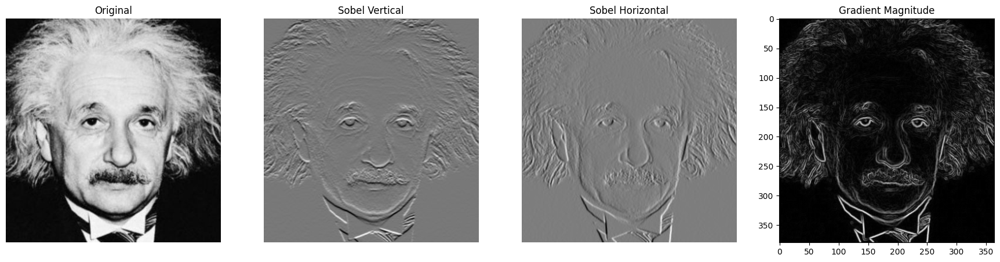

In [96]:
f = cv.imread(r'einstein.png', cv.IMREAD_GRAYSCALE).astype(np.float32)
assert f is not None

sobel_h1 = np.array([[1],[2],[1]], dtype='float')
sobel_h2 = np.array([[1,0,-1]],dtype='float')
sobel_v1 = np.array([[-1],[0],[1]], dtype='float')
sobel_v2 = np.array([[-1,-2,-1]],dtype='float')
f_y1 = cv.filter2D(f, -1, sobel_h1)
f_y2 = cv.filter2D(f_y1, -1, sobel_h2)
f_x1 = cv.filter2D(f, -1, sobel_v1)
f_x2 = cv.filter2D(f_x1, -1, sobel_v2)
grad = np.sqrt(f_x2**2 + f_y2**2)

fig, ax = plt.subplots(1,4, figsize=(22,10))
ax[0].imshow(f, cmap='gray',vmin=0,vmax=255)
ax[0].set_title('Original')
ax[1].imshow(f_x2, cmap='gray')
ax[1].set_title('Sobel Vertical')
ax[2].imshow(f_y2, cmap='gray')
ax[2].set_title('Sobel Horizontal')
ax[3].imshow(grad, cmap='gray')
ax[3].set_title('Gradient Magnitude')
for i in range(3):
    ax[i].axis('off')
plt.show()

Q8

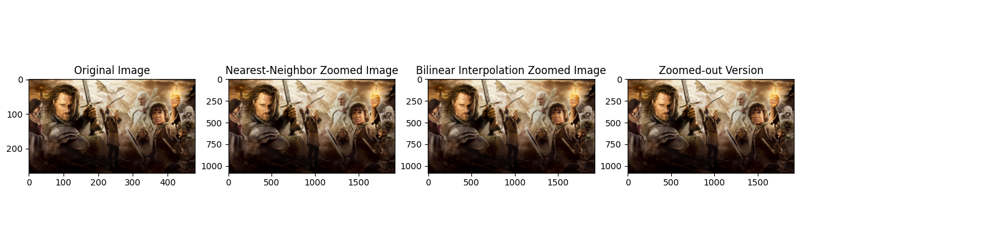

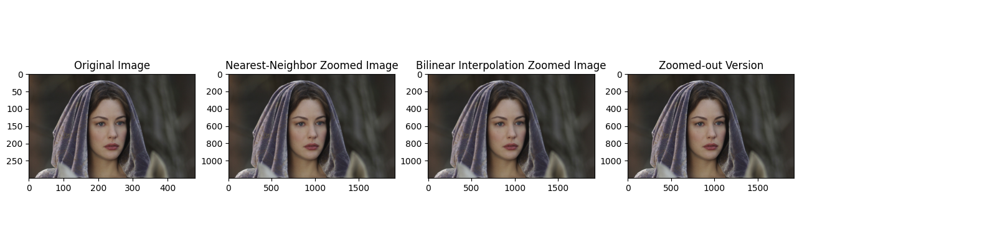

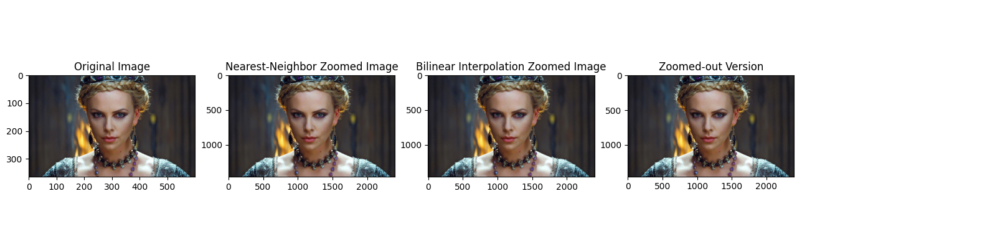

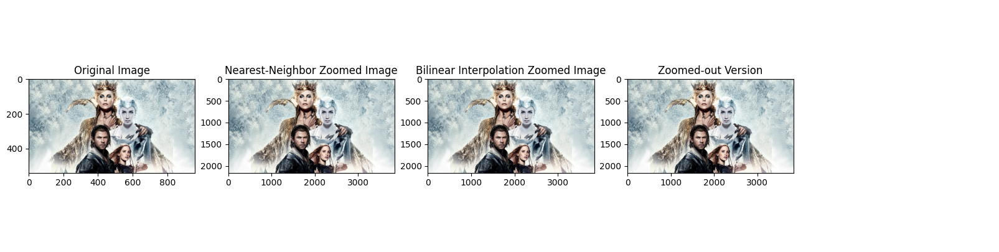

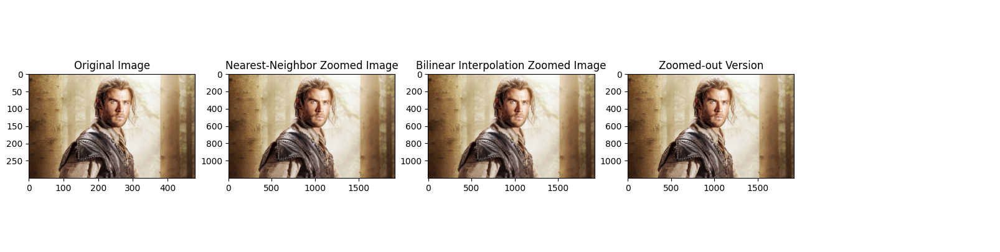

...

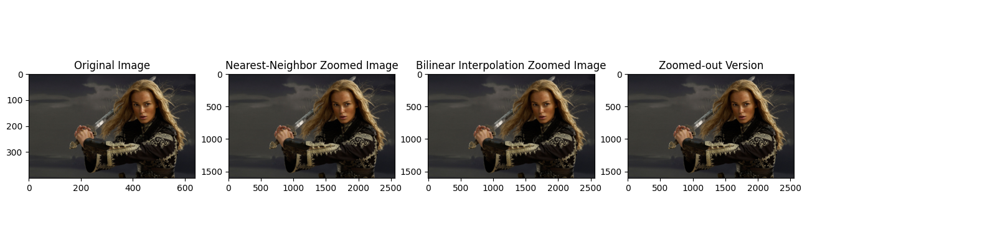

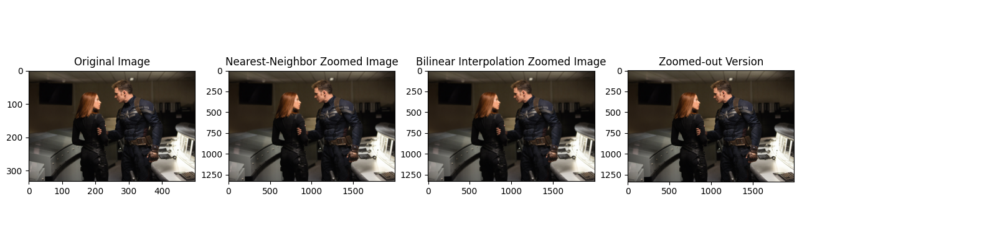

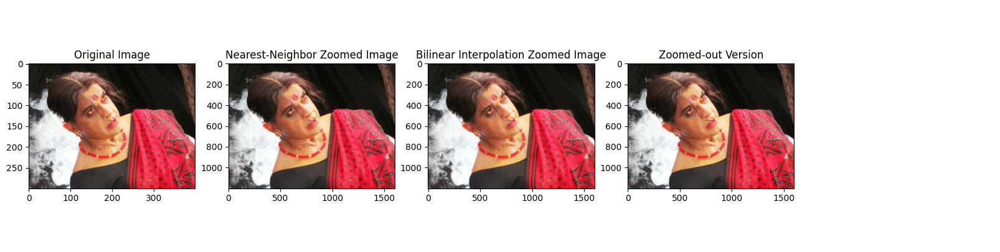

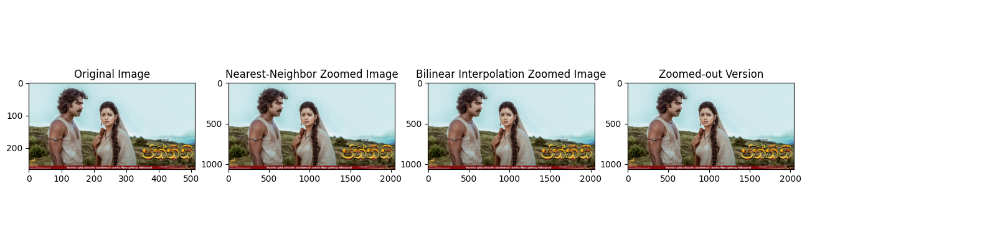

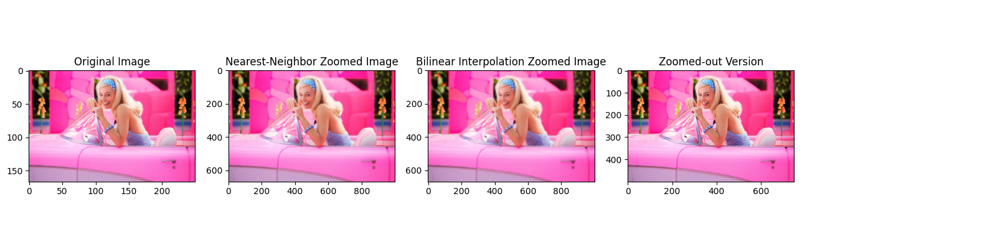

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

originals = ["im01small.png", "im02small.png", "im03small.png", "im04small.png", "im05small.png", "im06small.png", "im07small.png", "im08small.png", "im09small.png", "im10small.png", "im11small.png"]
zoomed_outs = ["im01.png", "im02.png", "im03.png", "im04.png", "im05.png", "im06.png", "im07.png", "im08.png", "im09.png", "im10.png", "im11.png"]

for i in range(11):
    img = cv.imread(originals[i])
    img1 = cv.imread(zoomed_outs[i])
    
    img_resized = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_NEAREST)
    bilinear_img = cv.resize(img, img_resized.shape[1::-1], interpolation=cv.INTER_LINEAR)

    ssd_near = np.sum((img_resized - img_resized) ** 2)  # Nearest-neighbor SSD is zero
    ssd_bilinear = np.sum((img_resized - bilinear_img) ** 2)

    max_possible_ssd = np.sum((img_resized - np.zeros_like(img_resized)) ** 2)

    normalized_ssd_near = ssd_near / max_possible_ssd
    normalized_ssd_bilinear = ssd_bilinear / max_possible_ssd

    fig, ax = plt.subplots(1, 5, figsize=(20, 5))
    ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")
    ax[1].imshow(cv.cvtColor(img_resized, cv.COLOR_BGR2RGB))
    ax[1].set_title(f"Nearest-Neighbor Zoomed Image")
    ax[2].imshow(cv.cvtColor(bilinear_img, cv.COLOR_BGR2RGB))
    ax[2].set_title(f"Bilinear Interpolation Zoomed Image")
    ax[3].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
    ax[3].set_title("Zoomed-out Version")
    ax[4].axis('off')
    plt.show()


Q9

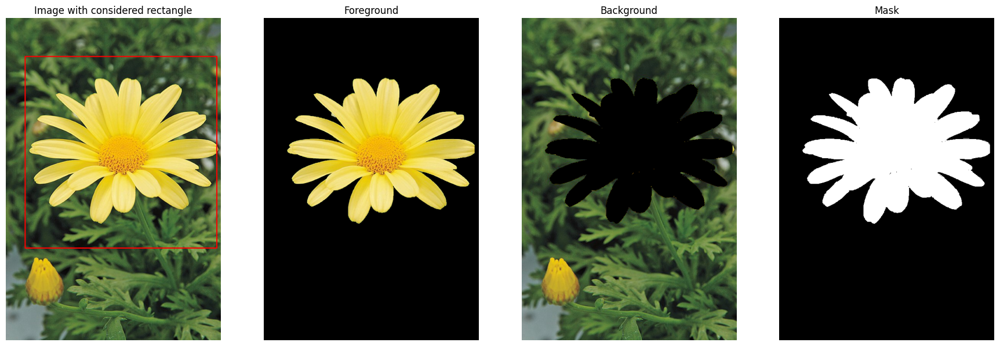

In [109]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

im = cv2.imread('daisy.jpg')
orig = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
mask = np.zeros(im.shape[:2], np.uint8)
bgdModel, fgdModel = np.zeros((1, 65), np.float64), np.zeros((1, 65), np.float64)
rect = (50, 100, 500, 500)
cv2.grabCut(im, mask, rect, bgdModel, fgdModel, 3, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
FG, BG = im * mask2[:, :, np.newaxis], im - (im * mask2[:, :, np.newaxis])
cv2.rectangle(orig, (50, 100), (550, 600), (255, 0, 0), 2)
fig, ax = plt.subplots(1, 4, figsize=(22, 10))
ax[0].imshow(orig), ax[0].set_title('Image with considered rectangle'), ax[0].axis('off')
ax[1].imshow(cv2.cvtColor(FG, cv2.COLOR_BGR2RGB)), ax[1].set_title('Foreground'), ax[1].axis('off')
ax[2].imshow(cv2.cvtColor(BG, cv2.COLOR_BGR2RGB)), ax[2].set_title('Background'), ax[2].axis('off')
ax[3].imshow(mask2 * 255, cmap='gray'), ax[3].set_title('Mask'), ax[3].axis('off')
plt.show()


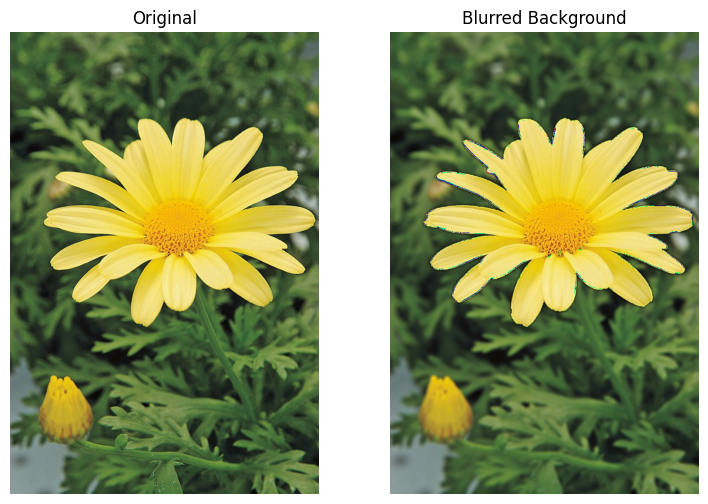

In [110]:
sigma = 4
BG_gauss = cv.GaussianBlur(BG,(7,7),sigma)
blurred_im= np.add(FG,BG_gauss)
fig,ax = plt.subplots(1,2, figsize=(9,6))
ax[0].imshow(cv.cvtColor(im,cv.COLOR_BGR2RGB))
ax[0].set_title('Original')
ax[1].imshow(cv.cvtColor(blurred_im,cv.COLOR_BGR2RGB))
ax[1].set_title('Blurred Background')
for i in range(2):
    ax[i].axis('off')
plt.show()